In [97]:
!git clone https://github.com/WongKinYiu/yolov7.git

time: 32 ms (started: 2024-08-15 15:29:07 +07:00)


fatal: destination path 'yolov7' already exists and is not an empty directory.


In [111]:
config_file_template = '''
# parameters
nc: 2  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple

# anchors
anchors:
  - [ 19,27,  44,40,  38,94 ]  # P3/8
  - [ 96,68,  86,152,  180,137 ]  # P4/16
  - [ 140,301,  303,264,  238,542 ]  # P5/32
  - [ 436,615,  739,380,  925,792 ]  # P6/64

# yolov7 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, ReOrg, []],  # 0
   [-1, 1, Conv, [64, 3, 1]],  # 1-P1/2
   
   [-1, 1, Conv, [128, 3, 2]],  # 2-P2/4
   [-1, 1, Conv, [64, 1, 1]],
   [-2, 1, Conv, [64, 1, 1]],
   [-1, 1, Conv, [64, 3, 1]],
   [-1, 1, Conv, [64, 3, 1]],
   [-1, 1, Conv, [64, 3, 1]],
   [-1, 1, Conv, [64, 3, 1]],
   [[-1, -3, -5, -6], 1, Concat, [1]],
   [-1, 1, Conv, [128, 1, 1]],  # 10
         
   [-1, 1, Conv, [256, 3, 2]],  # 11-P3/8
   [-1, 1, Conv, [128, 1, 1]],
   [-2, 1, Conv, [128, 1, 1]],
   [-1, 1, Conv, [128, 3, 1]],
   [-1, 1, Conv, [128, 3, 1]],
   [-1, 1, Conv, [128, 3, 1]],
   [-1, 1, Conv, [128, 3, 1]],
   [[-1, -3, -5, -6], 1, Concat, [1]],
   [-1, 1, Conv, [256, 1, 1]],  # 19
         
   [-1, 1, Conv, [512, 3, 2]],  # 20-P4/16
   [-1, 1, Conv, [256, 1, 1]],
   [-2, 1, Conv, [256, 1, 1]],
   [-1, 1, Conv, [256, 3, 1]],
   [-1, 1, Conv, [256, 3, 1]],
   [-1, 1, Conv, [256, 3, 1]],
   [-1, 1, Conv, [256, 3, 1]],
   [[-1, -3, -5, -6], 1, Concat, [1]],
   [-1, 1, Conv, [512, 1, 1]],  # 28
         
   [-1, 1, Conv, [768, 3, 2]],  # 29-P5/32
   [-1, 1, Conv, [384, 1, 1]],
   [-2, 1, Conv, [384, 1, 1]],
   [-1, 1, Conv, [384, 3, 1]],
   [-1, 1, Conv, [384, 3, 1]],
   [-1, 1, Conv, [384, 3, 1]],
   [-1, 1, Conv, [384, 3, 1]],
   [[-1, -3, -5, -6], 1, Concat, [1]],
   [-1, 1, Conv, [768, 1, 1]],  # 37
         
   [-1, 1, Conv, [1024, 3, 2]],  # 38-P6/64
   [-1, 1, Conv, [512, 1, 1]],
   [-2, 1, Conv, [512, 1, 1]],
   [-1, 1, Conv, [512, 3, 1]],
   [-1, 1, Conv, [512, 3, 1]],
   [-1, 1, Conv, [512, 3, 1]],
   [-1, 1, Conv, [512, 3, 1]],
   [[-1, -3, -5, -6], 1, Concat, [1]],
   [-1, 1, Conv, [1024, 1, 1]],  # 46
  ]

# yolov7 head
head:
  [[-1, 1, SPPCSPC, [512]], # 47
  
   [-1, 1, Conv, [384, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [37, 1, Conv, [384, 1, 1]], # route backbone P5
   [[-1, -2], 1, Concat, [1]],
   
   [-1, 1, Conv, [384, 1, 1]],
   [-2, 1, Conv, [384, 1, 1]],
   [-1, 1, Conv, [192, 3, 1]],
   [-1, 1, Conv, [192, 3, 1]],
   [-1, 1, Conv, [192, 3, 1]],
   [-1, 1, Conv, [192, 3, 1]],
   [[-1, -2, -3, -4, -5, -6], 1, Concat, [1]],
   [-1, 1, Conv, [384, 1, 1]], # 59
  
   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [28, 1, Conv, [256, 1, 1]], # route backbone P4
   [[-1, -2], 1, Concat, [1]],
   
   [-1, 1, Conv, [256, 1, 1]],
   [-2, 1, Conv, [256, 1, 1]],
   [-1, 1, Conv, [128, 3, 1]],
   [-1, 1, Conv, [128, 3, 1]],
   [-1, 1, Conv, [128, 3, 1]],
   [-1, 1, Conv, [128, 3, 1]],
   [[-1, -2, -3, -4, -5, -6], 1, Concat, [1]],
   [-1, 1, Conv, [256, 1, 1]], # 71
   
   [-1, 1, Conv, [128, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [19, 1, Conv, [128, 1, 1]], # route backbone P3
   [[-1, -2], 1, Concat, [1]],
   
   [-1, 1, Conv, [128, 1, 1]],
   [-2, 1, Conv, [128, 1, 1]],
   [-1, 1, Conv, [64, 3, 1]],
   [-1, 1, Conv, [64, 3, 1]],
   [-1, 1, Conv, [64, 3, 1]],
   [-1, 1, Conv, [64, 3, 1]],
   [[-1, -2, -3, -4, -5, -6], 1, Concat, [1]],
   [-1, 1, Conv, [128, 1, 1]], # 83
      
   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 71], 1, Concat, [1]],  # cat
   
   [-1, 1, Conv, [256, 1, 1]],
   [-2, 1, Conv, [256, 1, 1]],
   [-1, 1, Conv, [128, 3, 1]],
   [-1, 1, Conv, [128, 3, 1]],
   [-1, 1, Conv, [128, 3, 1]],
   [-1, 1, Conv, [128, 3, 1]],
   [[-1, -2, -3, -4, -5, -6], 1, Concat, [1]],
   [-1, 1, Conv, [256, 1, 1]], # 93
      
   [-1, 1, Conv, [384, 3, 2]],
   [[-1, 59], 1, Concat, [1]],  # cat
   
   [-1, 1, Conv, [384, 1, 1]],
   [-2, 1, Conv, [384, 1, 1]],
   [-1, 1, Conv, [192, 3, 1]],
   [-1, 1, Conv, [192, 3, 1]],
   [-1, 1, Conv, [192, 3, 1]],
   [-1, 1, Conv, [192, 3, 1]],
   [[-1, -2, -3, -4, -5, -6], 1, Concat, [1]],
   [-1, 1, Conv, [384, 1, 1]], # 103
      
   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 47], 1, Concat, [1]],  # cat
   
   [-1, 1, Conv, [512, 1, 1]],
   [-2, 1, Conv, [512, 1, 1]],
   [-1, 1, Conv, [256, 3, 1]],
   [-1, 1, Conv, [256, 3, 1]],
   [-1, 1, Conv, [256, 3, 1]],
   [-1, 1, Conv, [256, 3, 1]],
   [[-1, -2, -3, -4, -5, -6], 1, Concat, [1]],
   [-1, 1, Conv, [512, 1, 1]], # 113
   
   [83, 1, Conv, [256, 3, 1]], #114
   [93, 1, Conv, [512, 3, 1]], #115
   [103, 1, Conv, [768, 3, 1]], #116
   [113, 1, Conv, [1024, 3, 1]], #117
   
   #[83, 1, Conv, [320, 3, 1]],
   #[71, 1, Conv, [640, 3, 1]],
   #[59, 1, Conv, [960, 3, 1]],
   #[47, 1, Conv, [1280, 3, 1]],

   [83, 1, Conv, [320, 3, 1]], # 118
   [93, 1, Conv, [640, 3, 1]], # 119
   [103, 1, Conv, [960, 3, 1]], # 120
   [113, 1, Conv, [1280, 3, 1]], #121

   [[114,115,116,117,118,119,120,121], 1, IAuxDetect, [nc, anchors]],   # Detect(P3, P4, P5, P6)
  ]

'''

with open('config.yaml', 'w') as f:
    f.write(config_file_template)

time: 0 ns (started: 2024-08-15 15:38:17 +07:00)


In [100]:
data_file_template = '''
train: ./scut_headface/images/train
test: ./scut_headface/images/test
val: ./scut_headface/images/val

nc: 2
names: ['head','face']
'''

with open('data.yaml', 'w') as f:
    f.write(data_file_template)

time: 0 ns (started: 2024-08-15 15:29:07 +07:00)


In [114]:
hyp_file_template = '''
lr0: 0.01  # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.2  # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937  # SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay 5e-4
warmup_epochs: 3.0  # warmup epochs (fractions ok)
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.1  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 0.7  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.20  # IoU training threshold
anchor_t: 4.0  # anchor-multiple threshold
# anchors: 3  # anchors per output layer (0 to ignore)
fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0.015  # image HSV-Hue augmentation (fraction)
hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.4  # image HSV-Value augmentation (fraction)
degrees: 0.0  # image rotation (+/- deg)
translate: 0.2  # image translation (+/- fraction)
scale: 0.9  # image scale (+/- gain)
shear: 0.0  # image shear (+/- deg)
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.0  # image flip up-down (probability)
fliplr: 0.5  # image flip left-right (probability)
mosaic: 1.0  # image mosaic (probability)
mixup: 0.15  # image mixup (probability)
copy_paste: 0.0  # image copy paste (probability)
paste_in: 0.15  # image copy paste (probability), use 0 for faster training
loss_ota: 0.8 # use ComputeLossOTA, use 0 for faster training
'''
#Change loss_ota to 0.5 for avoid overfitting
with open('hyp.yaml', 'w') as f:
    f.write(hyp_file_template)

time: 15 ms (started: 2024-08-15 18:10:30 +07:00)


In [102]:
!pip install ipython-autotime
#!pip install tensorboard
%load_ext autotime

The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
time: 579 ms (started: 2024-08-15 15:29:07 +07:00)


In [112]:
#!tensorboard --logdir OJT
%load_ext autotime
!python yolov7/train_aux.py --batch 16  --cfg ./config.yaml --epochs 60 --data ./data.yaml --hyp ./hyp.yaml --img 640 --weights 'yolov7-w6.pt' --device 0 --entity 'yolov7' --project Test --name Tester

The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
^C
time: 14min (started: 2024-08-15 15:38:31 +07:00)


wandb: Install Weights & Biases for YOLOR logging with 'pip install wandb' (recommended)

autoanchor: Analyzing anchors... anchors/target = 2.33, Best Possible Recall (BPR) = 0.9853


YOLOR  2024-8-13 torch 2.4.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4080 SUPER, 16375.5MB)

Namespace(weights="'yolov7-w6.pt'", cfg='./config.yaml', data='./data.yaml', hyp='./hyp.yaml', epochs=100, batch_size=16, img_size=[640, 640], rect=False, resume=False, nosave=False, notest=False, noautoanchor=False, evolve=False, bucket='', cache_images=False, image_weights=False, device='0', multi_scale=False, single_cls=False, adam=False, sync_bn=False, local_rank=-1, workers=8, project='Test', entity="'yolov7'", name='Tester', exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, upload_dataset=False, bbox_interval=-1, save_period=-1, artifact_alias='latest', v5_metric=False, world_size=1, global_rank=-1, save_dir='Test\\Tester27', total_batch_size=16)
tensorboard: Start with 'tensorboard --logdir Test', view at http://localhost:6006/
hyperparameters: lr0=0.01, lrf=0.2, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, c

In [104]:
import torch
print(torch.cuda.is_available())

True
time: 0 ns (started: 2024-08-15 15:29:12 +07:00)


In [105]:
#!pip uninstall torch torchvision
#!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118


time: 0 ns (started: 2024-08-15 15:29:12 +07:00)


In [118]:
!python yolov7/detect.py --weights Test/Final1/weights/best.pt --conf 0.3 --img 1280 --source scut_headface/images/test/

Namespace(weights=['Test/Final1/weights/best.pt'], source='scut_headface/images/test/', img_size=1280, conf_thres=0.3, iou_thres=0.45, device='', view_img=False, save_txt=False, save_conf=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', exist_ok=False, no_trace=False)
Fusing layers... 
IAuxDetect.fuse
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

20 heads, 12 faces, Done. (8.0ms) Inference, (51.0ms) NMS
 The image with the result is saved in: runs\detect\exp20\PartA_00002.jpg
11 heads, 6 faces, Done. (9.0ms) Inference, (1.0ms) NMS
 The image with the result is saved in: runs\detect\exp20\PartA_00019.jpg
6 heads, 3 faces, Done. (9.0ms) Inference, (1.0ms) NMS
 The image with the result is saved in: runs\detect\exp20\PartA_00022.jpg
13 heads, 7 faces, Done. (8.0ms) Inference, (1.0ms) NMS
 The image with the result is saved in: runs\detect\exp20\PartA_00029.jpg
10 heads, 7 faces, Do

YOLOR  2024-8-13 torch 2.4.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4080 SUPER, 16375.5MB)

d:\ojt khoi\yolov7\models\experimental.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental featu

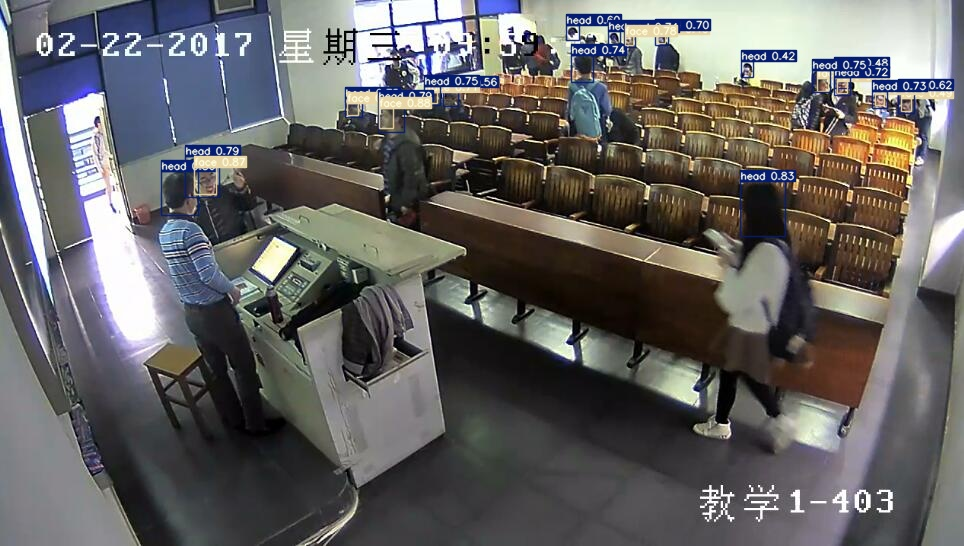

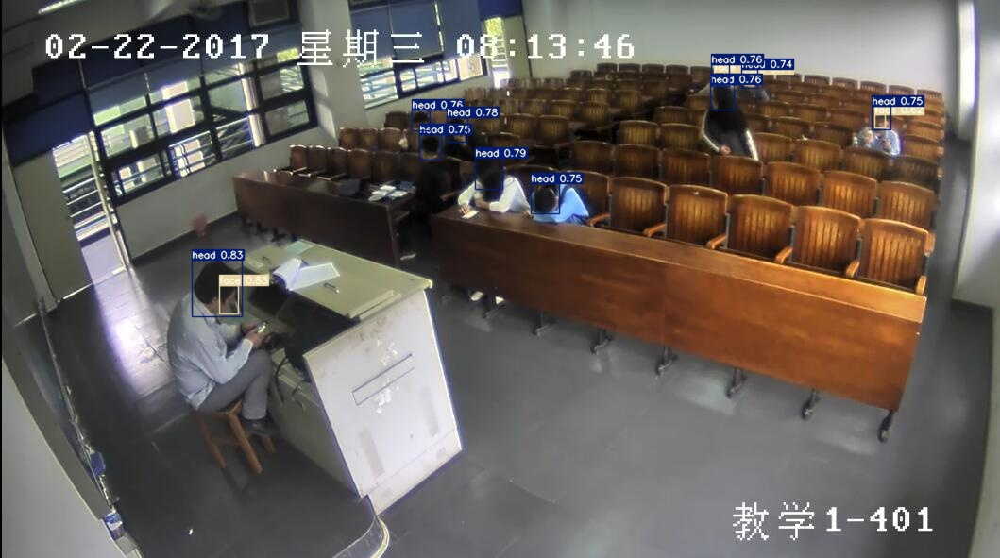

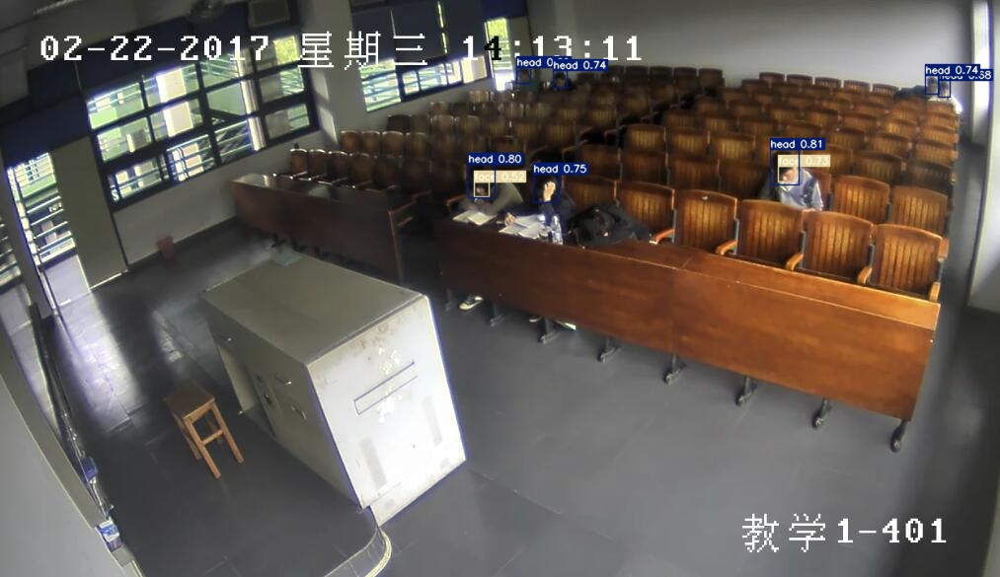

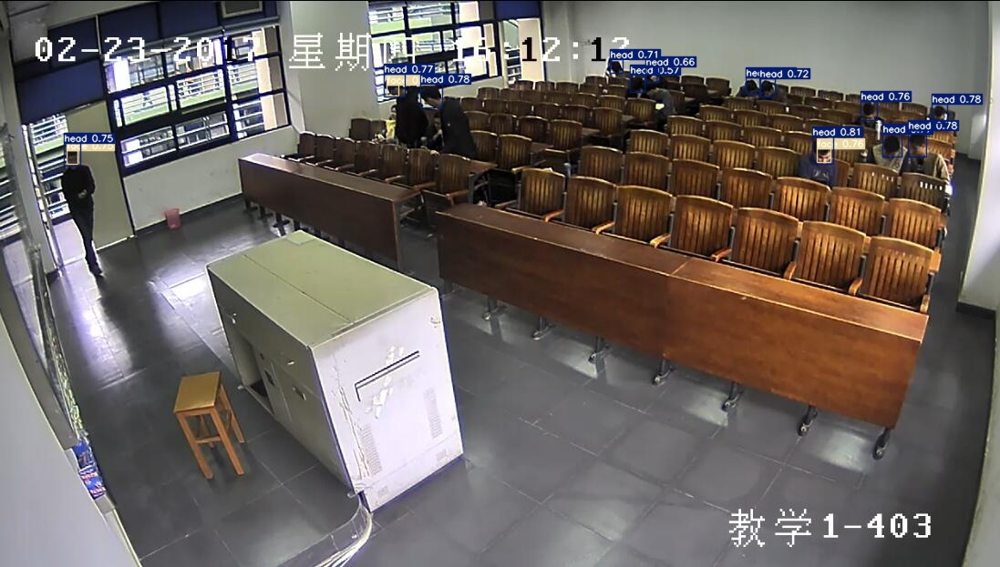

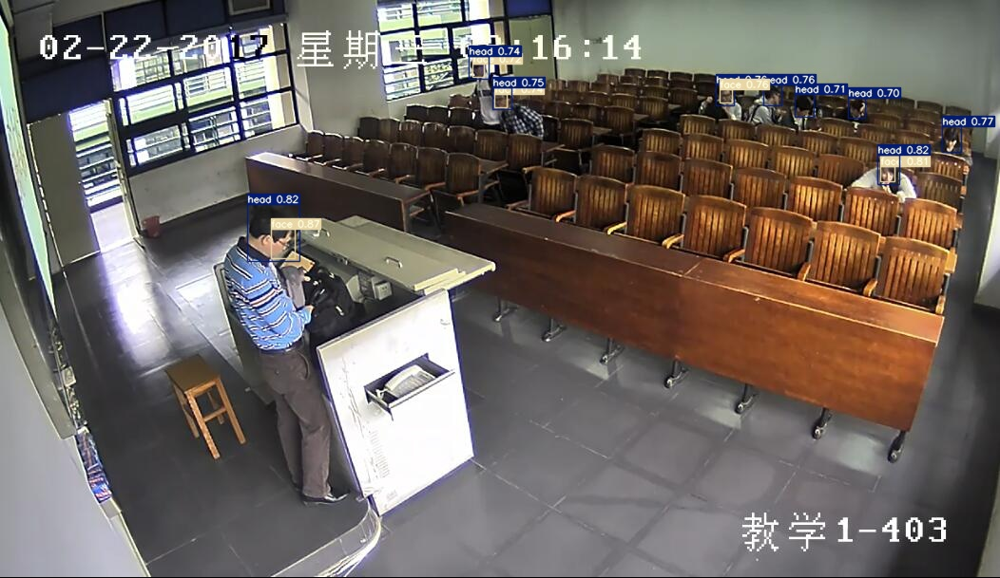

...

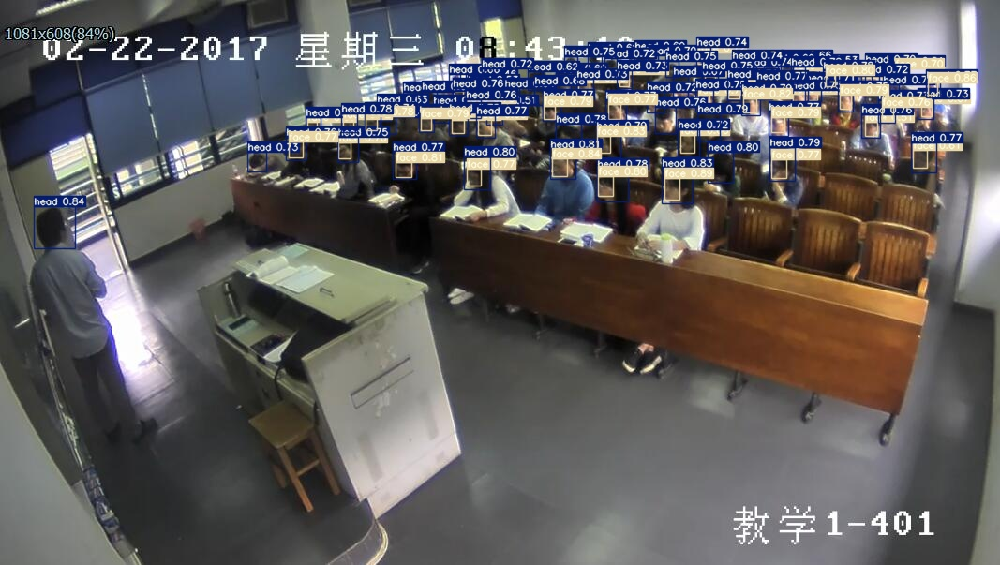

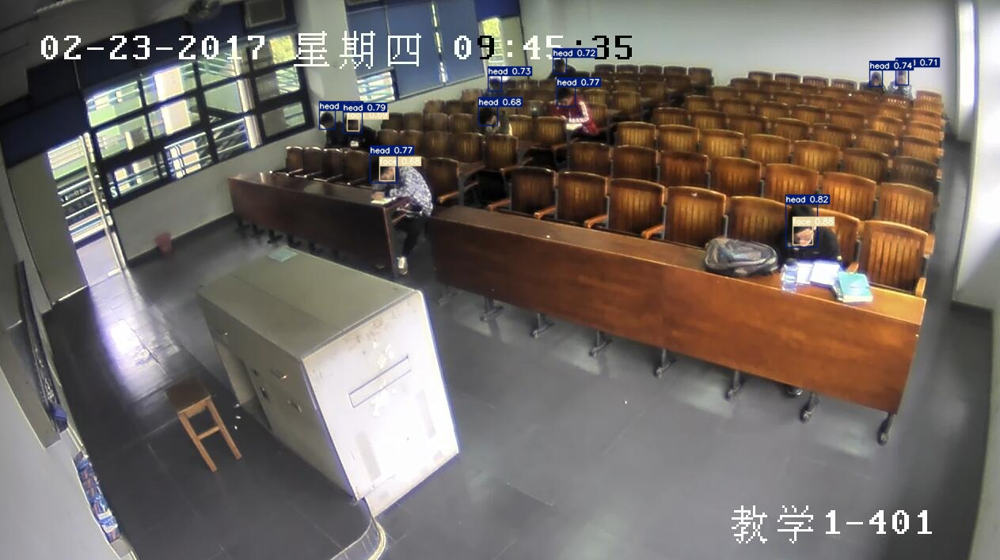

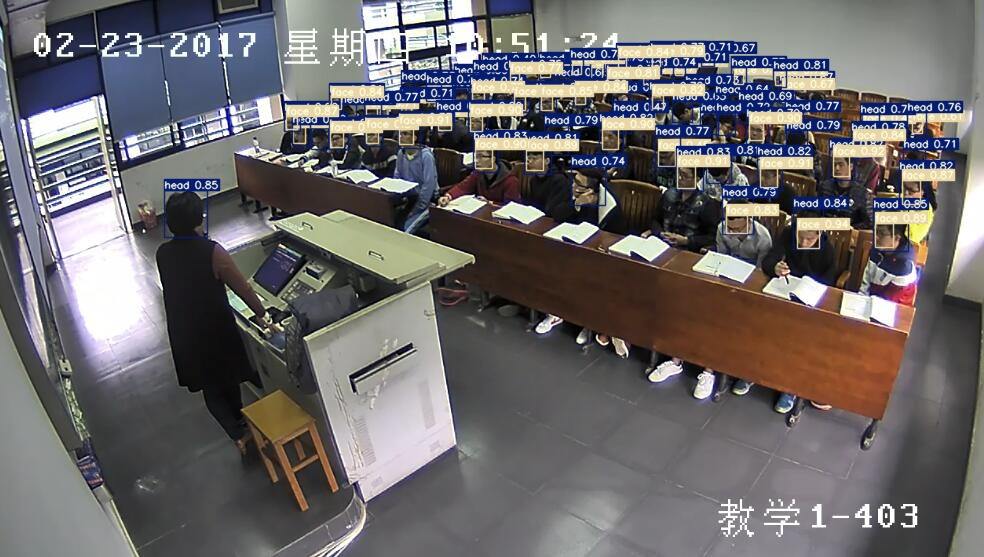

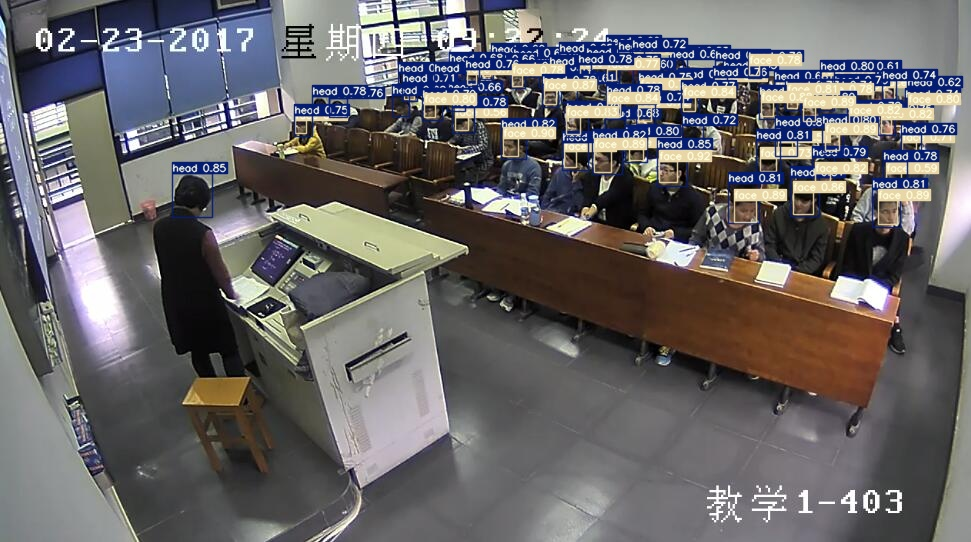

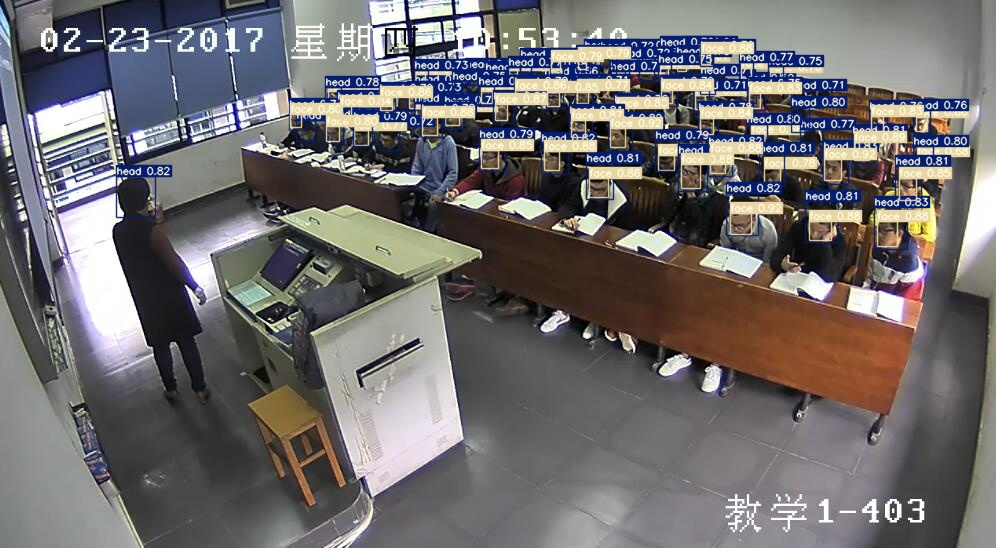

time: 63 ms (started: 2024-08-15 15:30:07 +07:00)


In [107]:
import os
import sys
import glob
#import wandb
import torch
from IPython.display import Image, clear_output, display  # to display images
for images in glob.glob('runs/detect/exp10/*.jpg')[0:20]:
    display(Image(filename=images))

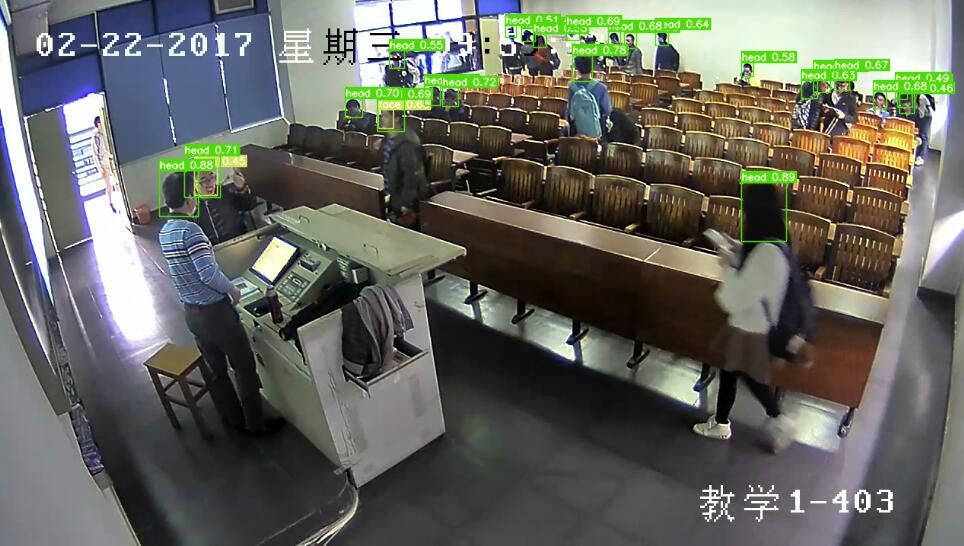

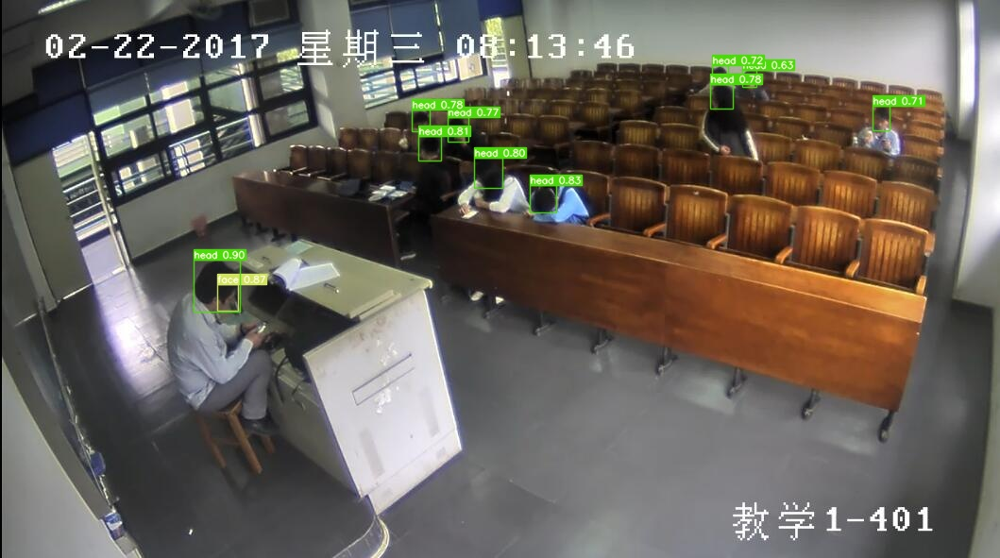

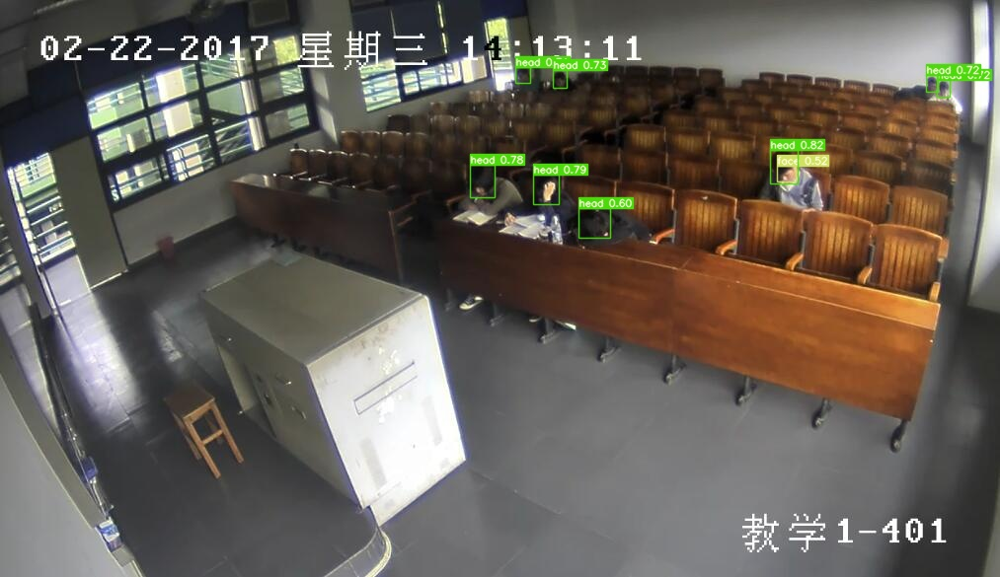

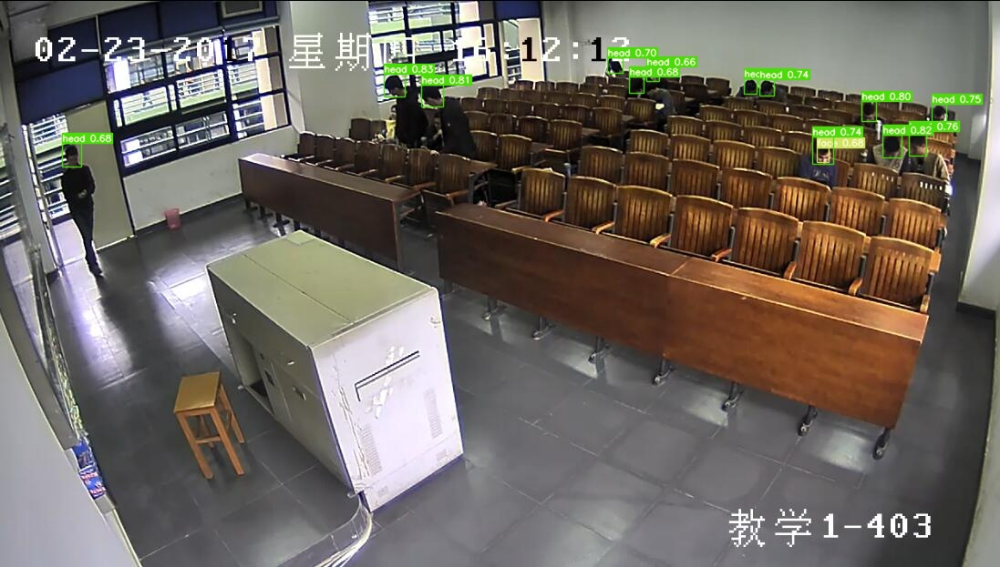

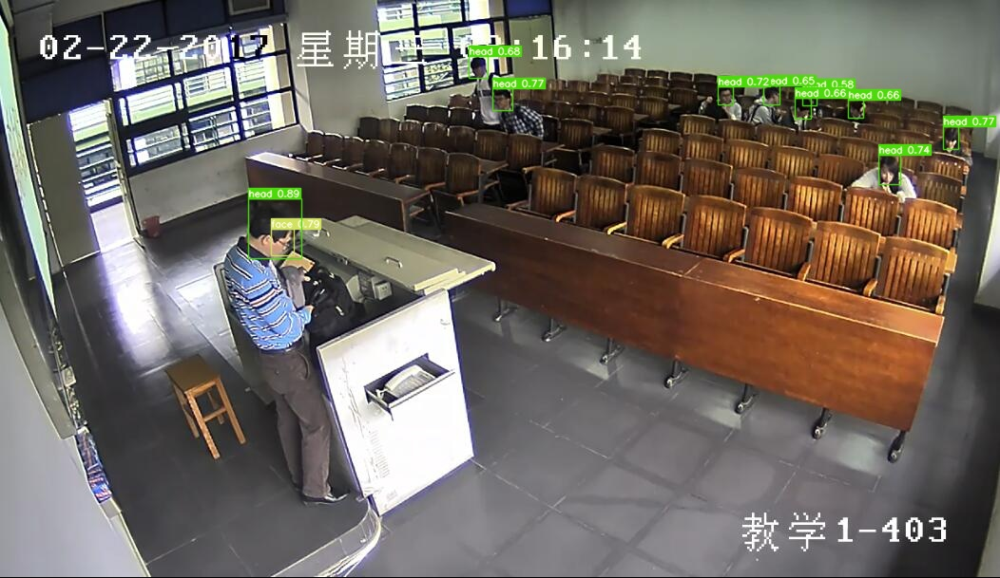

...

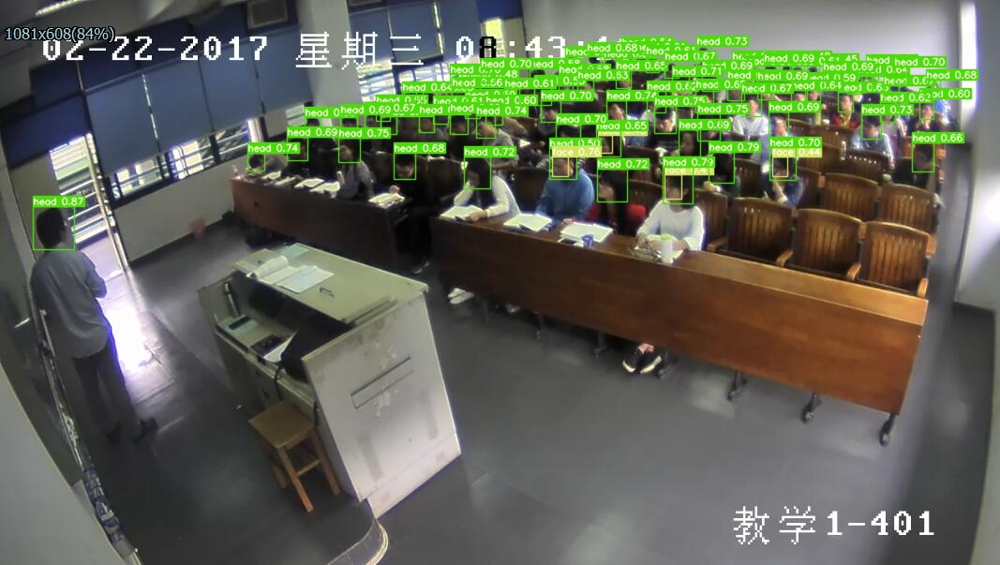

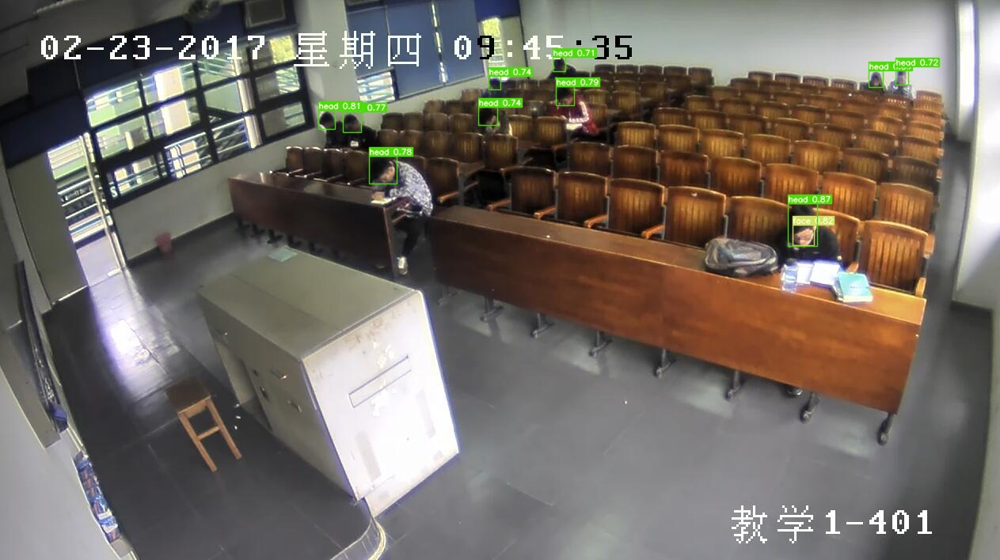

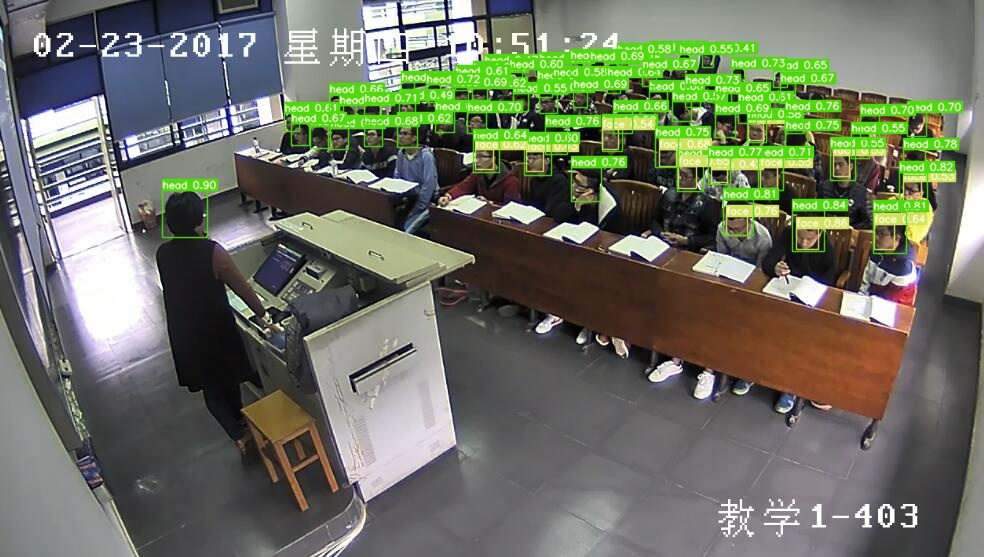

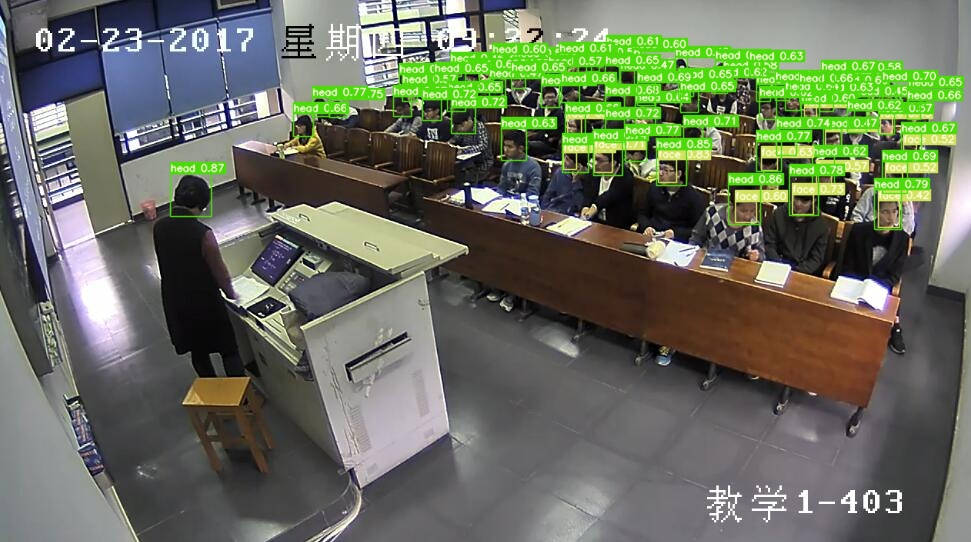

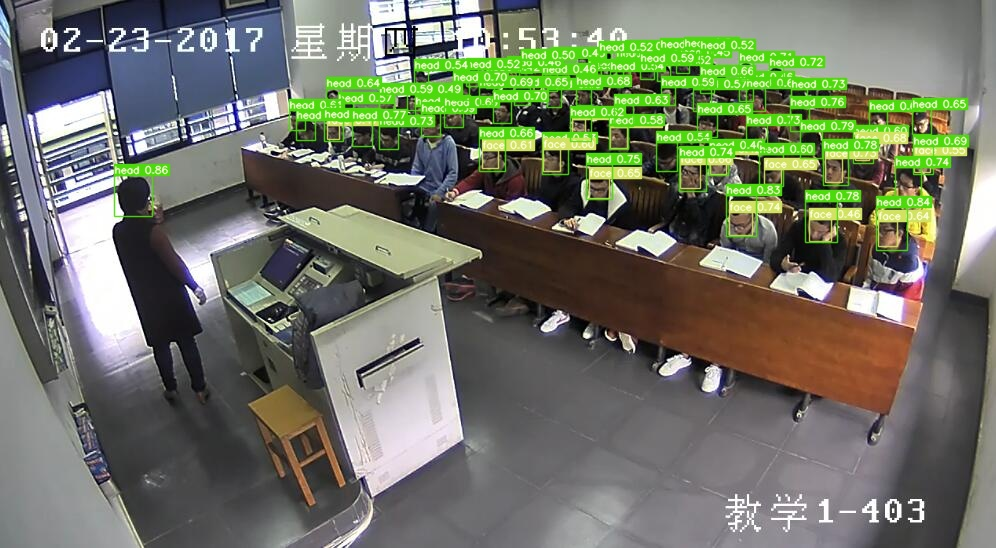

time: 78 ms (started: 2024-08-15 15:30:07 +07:00)


In [108]:
import os
import sys
import glob
#import wandb
import torch
from IPython.display import Image, clear_output, display  # to display images
for images in glob.glob('runs/detect/exp11/*.jpg')[0:20]:
    display(Image(filename=images))